# Laboratorio Transmisión Digital

**Cátedra:** Introducción a la Ing. en Telecomunicaciones II


## Objetivos

### Generales

- Abordar y recordar conceptos sobre transmisión digital.
- Afianzar los mismos mediante simulaciones por software e implementación en sistemas embebidos.

### Específicos

- Introducir conceptos generales sobre transmisión digital.
- Reforzar conceptos relevantes respecto a:
    - Muestreo
    - Cuantificación
    - Modulación
- Afianzar lo anterior exponiendo procedimiento de simulaciones por software así como sus resultados.
- E implementaciones de transmisión digital en sistemas embebidos.
- Acompañando con ejercicios prácticos.

## Introducción

La transmisión digital consiste en el envío de información en forma de **pulsos digitales** de un origen a un destino. Si la señal que se desea enviar es de naturaleza analógica, *como ser una señal de voz*, se requiere de un procesamiento previo a la transmisión en el que se convierte la misma de **analógica a digital**.

![](img/diagrama_bloques_general.png)

*Diagrama de bloques transmisión digital*

### Ventajas

* Presenta mayor inmunidad al ruido.
* Se regenera la señal.
* La medición y evaluación de las señales es más simple.
* Así como la corrección de errores.

### Desventajas

* Se requiere mayor ancho de banda.
* Así como equipos más costosos.
* Las señales analógicas requieren un proceso de conversión A/D y D/A
* Se requiere sincronismo.

In [1]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
from sklearn import preprocessing
import math

from matplotlib.widgets import Slider, Button, RadioButtons
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import IPython.display as ipd
from scipy.io import wavfile

pi = math.pi

## Conceptos preliminares

### Señales periódicas

Una señal periódica es aquella que cuyo comportamiento se repite en el tiempo y cumple que $x(t + T) = x(t)$, donde `T` es el período en segundos y $f = \frac{1}{T}$ la frecuencia de cambio en Hz.

Una señal periódica bien conocida es la de comportamiento cosenoidal, que responde a la expresión $x(t) = A · cos(w · t) = A · cos(2·\pi· f · t)$

#### Representación en el dominio del tiempo

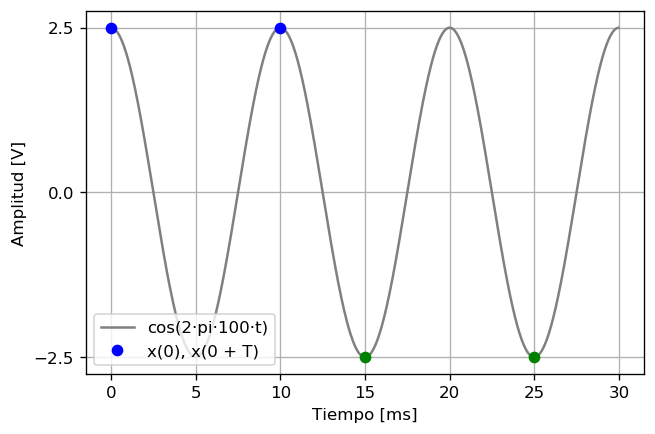

In [2]:
t = np.linspace(0, 0.03, 1000, endpoint=False)
x = 2.5*np.cos(2 * np.pi * 100 * t)

plt.figure(1, dpi=120)
plt.plot(t, x, 'grey',
        0, 2.5, 'bo',
        0.01, 2.5, 'bo',
        0.015, -2.5, 'go',
        0.025, -2.5, 'go')
plt.legend(['cos(2·pi·100·t)', 'x(0), x(0 + T)'], loc=3)
plt.xticks([0, 0.005, 0.010, 0.0150, 0.020, 0.025, 0.030],
           ('0', '5', '10', '15', '20', '25', '30'))
plt.yticks([-2.5, 0, 2.5])
plt.xlabel('Tiempo [ms]')
plt.ylabel('Amplitud [V]')

plt.grid(b=0.5)
#plt.savefig('img/' + 'SeñalPeriodica')
plt.show()

`Completar la información faltante`

* **Amplitud máxima de la señal**: ........... `[V]`
* **Período de la señal**: ........... `[s]`
* **Frecuencia de la señal**: ........... `[Hz]`

#### Representación en el dominio de la frecuencia

Dibujar en el siguiente eje coordenado el espectro de la señal antes analizada.

`Completar la información faltante`

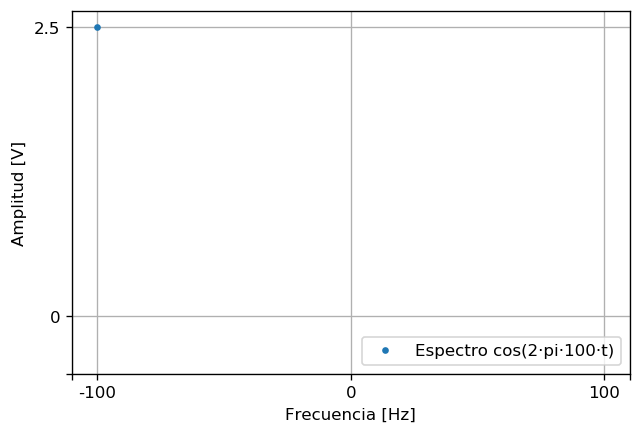

In [3]:
plt.figure(1, dpi=120)
plt.plot(-100, 2.5, '.')
plt.legend(['Espectro cos(2·pi·100·t)'], loc=4)
plt.xticks([-110, -100, 0, 100, 110], ('', '-100', '0', '100', ''))
plt.yticks([-0.5, 0, 2.5], ('', '0', '2.5'))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud [V]')

plt.grid(b=0.5)
#plt.savefig('img/' + 'EspectroSeñalPeriodica')
plt.show()

## Digitalización

Si se desea enviar una señal de naturaleza analógica a través de un sistema de transmisión digital, debe ser digitalizada, dicho proceso consiste en el **muestreo**, **cuantificación** y **codificación** de la señal, previo a la modulación.

![](img/diagrama.png)

### Muestreo

Consiste en obtener una cantidad finita de *muestras* de una señal continua, es decir los valores en amplitud de la señal original a determinados valores en el tiempo, para construir así una señal discreta apta para ser enviada en un sistema de transmisión digital.

Para que la señal pueda ser reconstruida en el sistema receptor, **la frecuencia con la que se toman las muestras debe ser mayor al doble de la máxima frecuencia de la señal original**, esto es:

$f_s > 2 · f_{max}$

*Teorema de muestreo o teorema de Nyquist-Shannon*

Por ejemplo:


`Completar la información faltante`


- Sea una señal cuya frecuencia es 50 Hz, la *mínima* frecuencia de muestreo que permite recuperar dicha señal está dada por $2·f_{max} = ........ = f_s$
- Si se desea muestrear la señal $cos (2·pi·20·t)$, la frecuencia de muestreo mínima necesaria está dada por $2·f_{max} = ........ = f_s$
- Para una señal compuesta por la suma de dos señales periódicas con períodos $T_1 = 0.015 s$ y $T_2 = 0.02 s$ respectivamente, la frecuencia de muestreo queda determinada por la máxima frecuencia de la señal $f_{max} = .....$, $f_s = 2·f_{max} = ........$

#### Muestreo señal cosenoidal

Se setea la frecuencia de la señal *(cosenoidal)* a muestrear `f`, y `N`, donde $f_s = N · f$. Se genera la señal cosenoidal que responde a la expresión $x(t) = 2·cos(2·\pi·f·t)$, así como la señal muestreada y se plotean ambas durante 3 períodos para diferentes frecuencias de muestreo.

In [4]:
def plot_muestreo(wfs):
    frec = 1
    fs = wfs
    N = int(fs / frec)
    #print(N)
    #if N < 1:
    #    N = 1
    
    duracion = 2
    cantidad_puntos = 500 * duracion

    t = np.linspace(0, duracion, cantidad_puntos, endpoint=False)
    x = 2*np.cos(2 * np.pi * frec * t)
    
    x_muestreada = signal.resample(x, N*4)
    muestreo = np.linspace(0, duracion, N*4, endpoint=False)
    
    plt.figure(1, dpi=120)
    plt.plot(t, x, 'grey')
    plt.scatter(muestreo, x_muestreada, c='orange')
    plt.legend(['Señal analógica de ' + str(frec) + ' Hz', 
                'Señal muestreada a ' + str(fs) + ' Hz'], loc=4)
    plt.grid(True)
    plt.figure(1).suptitle('Muestreo', fontsize=20)
    plt.xticks([0, 0.5, 1, 1.5])
    plt.yticks([-2, 0, 2])
    plt.xlabel('Tiempo en segundos', fontsize=18)
    plt.ylabel('Amplitud en Volt', fontsize=16)
    plt.xlim(0, duracion)
    plt.ylim(-2.5, 2.5)
    plt.savefig('analogica')
    plt.show()
    print('f = ', frec, 'Hz')
    print('fs = ', fs, 'Hz')
    print()
    if N >= 2:
        print('Se cumple el teorema de muestreo')
    else:
        print('NO se cumple el teorema de muestreo: fs >= 2f')
    print('fs = ', N, '· f')
    
#wfrec = widgets.IntSlider(min=1,max=10,step=1,value=1, description='f en Hz')
wfs = widgets.IntSlider(min=1,max=10,step=1,value=1, description='fs en Hz')

interactive_plot = interactive(plot_muestreo, wfs = wfs)
output = interactive_plot.children[-1]
output.layout.height = '800px'
interactive_plot

interactive(children=(IntSlider(value=1, description='fs en Hz', max=10, min=1), Output(layout=Layout(height='…

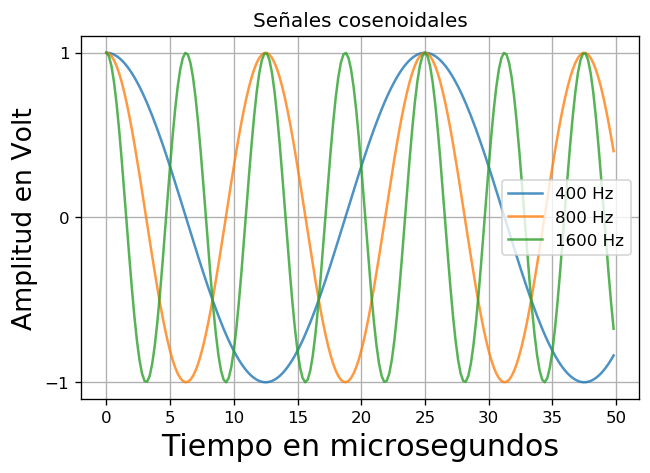

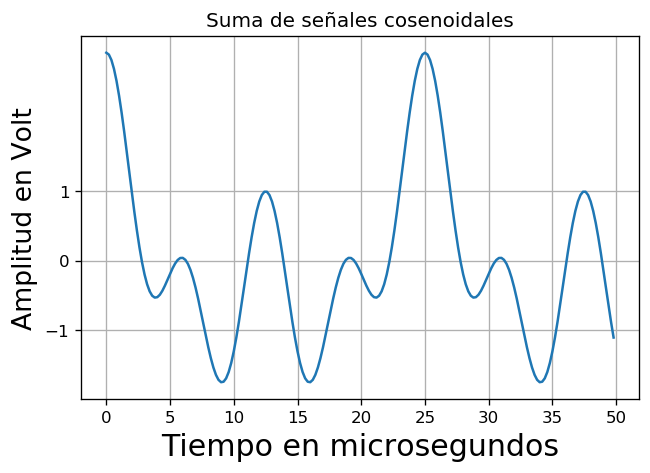

In [5]:
sr = 50000
frecuencias = [400, 800, 1600]
T = 2    # seconds
t = np.linspace(0, T, int( T * sr), endpoint=False) # time variable

cosenos = []
leyendas = []
for i, frec in enumerate(frecuencias):
    x = np.cos(2 * np.pi * frec * t)
    cosenos.append(x)
    leyendas.append(str(frec) + ' Hz')
    
plt.figure(1, dpi = 120)
plt.plot(t[0:200], cosenos[0][0:200], 
         t[0:200], cosenos[1][0:200], 
         t[0:200], cosenos[2][0:200],
        alpha=0.8)
plt.title('Señales cosenoidales')
plt.legend(leyendas)
plt.xticks([0, 0.0005, 0.001, 0.0015, 0.0020, 0.0025, 0.0030, 0.0035, 0.0040],
          ('0', '5', '10','15', '20','25','30','35','50'))
plt.yticks([-1, 0, 1])
plt.xlabel('Tiempo en microsegundos', fontsize=18)
plt.ylabel('Amplitud en Volt', fontsize=16)
plt.grid()
    
suma_cosenos = sum(cosenos)
plt.figure(-1, dpi = 120)
plt.plot(t[0:200], suma_cosenos[0:200])
plt.title('Suma de señales cosenoidales')
plt.xlabel('Tiempo en microsegundos', fontsize=18)
plt.ylabel('Amplitud en Volt', fontsize=16)
plt.xticks([0, 0.0005, 0.001, 0.0015, 0.0020, 0.0025, 0.0030, 0.0035, 0.0040],
          ('0', '5', '10','15', '20','25','30','35','50'))
plt.yticks([-1, 0, 1])
plt.grid()

/home/bibiana/usr/miniconda3/envs/webapp/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  """


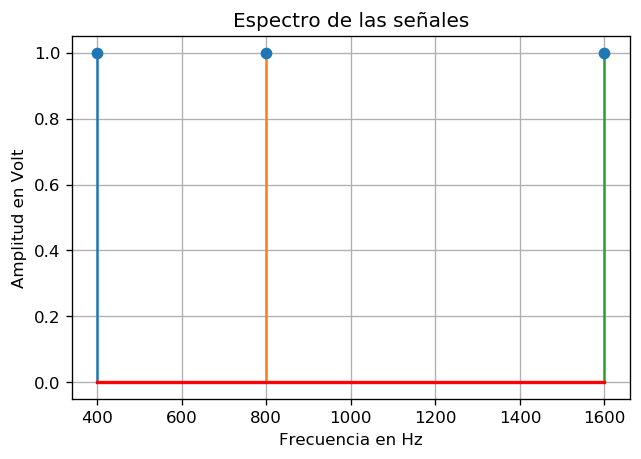

In [6]:
# returns 10 evenly spaced samples from 0.1 to 2*PI
hz = [400, 800, 1600]
x = [1, 1, 1]
plt.figure(-3, dpi = 120)
markerline, stemlines, baseline = plt.stem(hz, x, '-')
# setting property of baseline with color red and linewidth 2
plt.setp(baseline, color='r', linewidth=2)
plt.title('Espectro de las señales')
plt.xlabel('Frecuencia en Hz')
plt.ylabel('Amplitud en Volt')
plt.grid()
plt.show()

`Completar la información faltante`

Para la señal compuesta que resulta de la suma de señales cosenoidales de `400`, `800` y `1600` `Hz`, la frecuencia máxima de la señal es ....... `Hz`, por lo que la frecuencia mínima de muestreo es $f_{s} = 2·f_{max} = $ ...... `Hz`.

In [7]:
sr = 50000
print('Coseno a 400 Hz')
ipd.Audio(cosenos[0], rate=sr)

Coseno a 400 Hz


In [8]:
sr = 50000
print('Coseno a 800 Hz')
ipd.Audio(cosenos[1], rate=sr)

Coseno a 800 Hz


In [9]:
sr = 50000
print('Coseno a 1600 Hz')
ipd.Audio(cosenos[2], rate=sr)

Coseno a 1600 Hz


In [10]:
suma_amplificada = 3 * suma_cosenos

In [11]:
sr = 50000
print('Suma de cosenos')
ipd.Audio(suma_amplificada, rate=sr)

Suma de cosenos


In [12]:
print('Muestreo a fs = fmax = 1600 Hz')
sr = 1600
ipd.Audio(10*suma_amplificada, rate=sr)

Muestreo a fs = fmax = 1600 Hz


In [13]:
print('Muestreo a fs = 1.9fmax = 1.9 * 1600 Hz')
sr = 1600 * 2.5
ipd.Audio(10*suma_cosenos, rate=sr)

Muestreo a fs = 1.9fmax = 1.9 * 1600 Hz


In [14]:
print('Muestreo a fs > 2fmax = 5 * 1600 Hz')
sr = 1600 * 5
ipd.Audio(10*suma_cosenos, rate=sr)

Muestreo a fs > 2fmax = 5 * 1600 Hz


In [15]:
print('Muestreo a fs > 2fmax = 10 * 1600 Hz')
sr = 1600 * 10
ipd.Audio(suma_cosenos, rate=sr)

Muestreo a fs > 2fmax = 10 * 1600 Hz


In [2]:
fs, tx_radio_ar = wavfile.read('sound/primera_transmision_radial_arg.wav')
print('Primera transmisión radial argentina, fs =', fs)
ipd.Audio(tx_radio_ar, rate=fs)

Primera transmisión radial argentina, fs = 22050


/home/bibiana/usr/miniconda3/envs/webapp/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


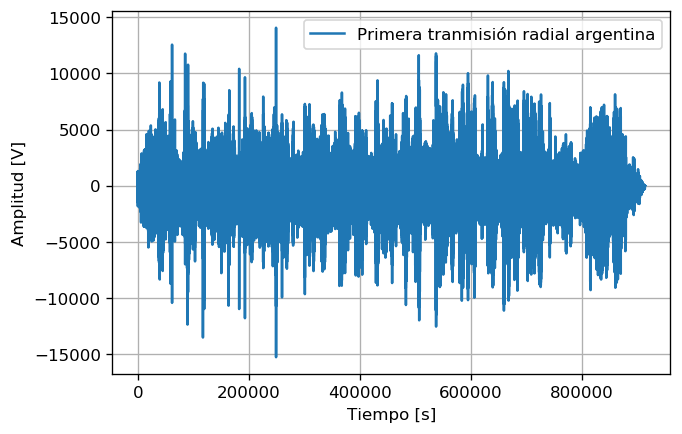

In [17]:
plt.figure(1, dpi=120)
plt.plot(tx_radio_ar)
plt.legend(['Primera tranmisión radial argentina'])
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [V]')

plt.grid(b=0.5)
#plt.savefig('img/' + 'SeñalPeriodica')
plt.show()

In [18]:
print('Muestreo a fs = 1/2 * 22050 Hz')
sr = fs / 2
ipd.Audio(tx_radio_ar, rate=sr)

Muestreo a fs = 1/2 * 22050 Hz


In [19]:
print('Muestreo a fs = 22050 Hz')
sr = fs*0.8
ipd.Audio(tx_radio_ar, rate=sr)

Muestreo a fs = 22050 Hz


In [20]:
print('Muestreo a fs = 2*22050 Hz')
sr = fs 
ipd.Audio(tx_radio_ar, rate=sr)

Muestreo a fs = 2*22050 Hz


### Cuantificación

Este proceso se lleva acabo inmediatamente después del muestreo de una señal analógica.

La etapa de cuantificación consta de un conjunto finito de niveles discretos, la cantidad de niveles está dada por potencias de dos: $L = 2^n$ en bits. La **magnitud del tamaño mínimo de escalón define la resolución del sistema**.

Habiendo obtenido una cantidad finita de valores de tensión de una señal analógica para determinados tiempos, se debe asignar a cada una de ellas un **cuánto**, esto es, se corresponde cada muestra con con **el nivel con valor más cercano a dicha muestra**.

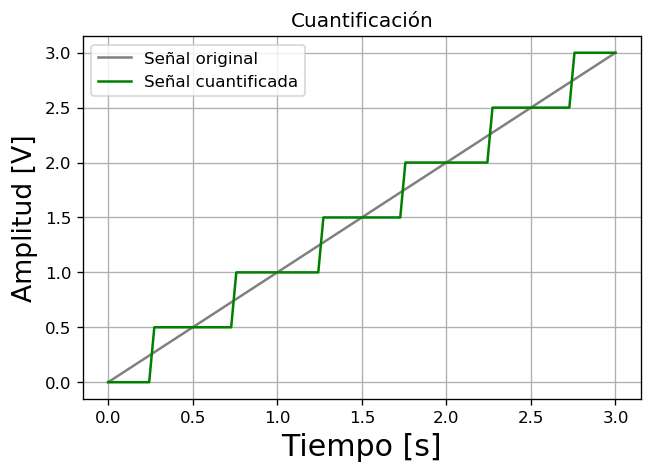

In [21]:
resolucion = 0.5
t = np.linspace(0, 3, 100)
x = t
x_cuantizada = resolucion * np.round(x / resolucion)

plt.figure(1, dpi = 120)
plt.plot(t, x, 'grey')
plt.plot(t, x_cuantizada, '-g')
plt.title('Cuantificación')
plt.legend(['Señal original', 'Señal cuantificada'])
plt.xlabel('Tiempo [s]', fontsize=18)
plt.ylabel('Amplitud [V]', fontsize=16)
plt.grid()
plt.savefig('cuantificada')

In [22]:
def plot_cuantificacion(wniveles):
    niveles = wniveles
    
    resolucion = 2 / niveles
    cant_bits = np.power(2, niveles)
    
    t = np.linspace(0, 3, 500)
    x = np.cos(2 * np.pi * t)
    x_cuantizada = resolucion * np.round(x / resolucion)

    lista_funciones = [t, x, 'gray', t, x_cuantizada, 'g-']
    leyendas = ['Señal original', 'Cuantificación']
    
    plt.figure(1, dpi=120)
    plt.plot(*lista_funciones)
    plt.legend(leyendas)
    plt.grid(True)
    plt.figure(1).suptitle('Cuantificación', fontsize=20)
    plt.xlabel('Tiempo en segundos', fontsize=18)
    plt.ylabel('Amplitud en Volt', fontsize=16)
    plt.xticks([0, 0.5, 1, 1.5, 2, 2.5, 3],
           ('0', '0.5', '1', '1.5', '2', '2.5', '3'))
    plt.yticks([-2.5, 0, 2.5])
    plt.xlim(0, 3)
    plt.ylim([-1.5, 1.5])
    plt.savefig('cuantificada')
    plt.show()
    print('Cantidad de niveles: ', niveles)
    print('Cantidad de bits: ', cant_bits)
    print('Resolución: ', resolucion)
    print()
    
wniveles = widgets.IntSlider(min=1,max=10,step=1,value=6, description='Niveles')

interactive_plot = interactive(plot_cuantificacion, wniveles = wniveles)
output = interactive_plot.children[-1]
output.layout.height = '800px'
interactive_plot

interactive(children=(IntSlider(value=6, description='Niveles', max=10, min=1), Output(layout=Layout(height='8…

#### Error de cuantificación

Al asignar nuevos valores a los niveles de tensión muestreados, se produce un **error** dado por la **diferencia entre el valor de tensión de la señal original y el cuánto asignado**.

Para la siguiente señal lineal, los valores de tensión, los cuántos asignados y los errores de cuantificación para tres valores de tiempo son:

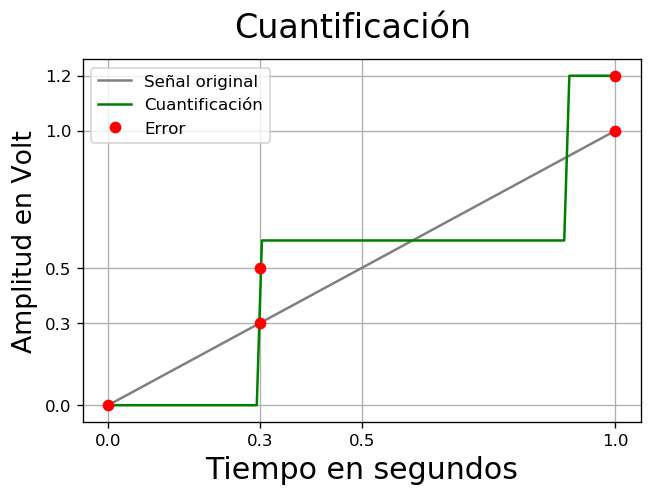

In [23]:
resolucion = 0.6
t = np.linspace(0, 1, 100)
x = t
x_cuantizada = resolucion * np.round(x / resolucion)

lista_funciones = [t, x, 'grey',
                   t, x_cuantizada, 'g-', 
                   0, 0, 'ro', 
                   0.3, 0.5, 'ro', 
                   0.3, 0.3, 'ro', 
                   1, 1, 'ro', 
                   1, 1.2, 'ro']

plt.figure(1, dpi=120)
plt.plot(*lista_funciones)
plt.figure(1).suptitle('Cuantificación', fontsize=20)
plt.legend(['Señal original', 'Cuantificación', 'Error'])
plt.xlabel('Tiempo en segundos', fontsize=18)
plt.ylabel('Amplitud en Volt', fontsize=16)
plt.xticks([0, 0.3, 0.5, 1])
plt.yticks([0, 0.3, 0.5, 1, 1.2])
#plt.xlim(0, 3)
#plt.ylim([-1.5, 1.5])
plt.grid(True)
plt.show()

    

##### Cálculo del error de cuantificación

| $t$   |$x(t)$| $x_Q(t)$   | $x(t) - x_Q(t)$     | $\epsilon_Q$|
|-----  |------|------------|---------------------|-------|
| $0$   | $0$  | $0$        | $0$                   | $0$   |
| $0.3$ | $0.5$| $0.3$      |$|0.3 - 0.5|$      |$0.2$  |
| $1$   | $1$  | $1.2$      |$|1 - 1.2|$        |$0.2$  |

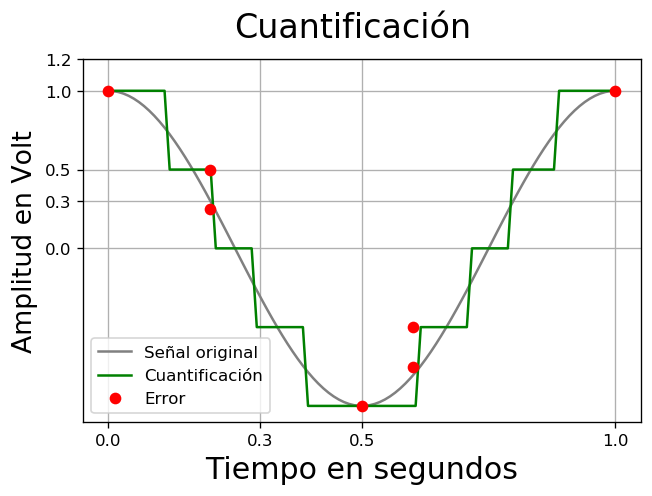

In [24]:
resolucion = 0.5
t = np.linspace(0, 1, 100)
x = np.cos(2 * np.pi * t)
x_cuantizada = resolucion * np.round(x / resolucion)

lista_funciones = [t, x, 'grey',
                   t, x_cuantizada, 'g-', 
                   0, 1, 'ro', 
                   0.5, -1, 'ro', 
                   0.2, 0.25, 'ro', 
                   0.2, 0.5, 'ro', 
                   1, 1, 'ro', 
                   0.6, -0.5, 'ro', 
                   0.6, -0.75, 'ro']


leyendas = ['Señal original', 'Cuantificación']

plt.figure(1, dpi=120)
plt.plot(*lista_funciones)
plt.figure(1).suptitle('Cuantificación', fontsize=20)
plt.legend(['Señal original', 'Cuantificación', 'Error'])
plt.xlabel('Tiempo en segundos', fontsize=18)
plt.ylabel('Amplitud en Volt', fontsize=16)
plt.xticks([0, 0.3, 0.5, 1])
plt.yticks([0, 0.3, 0.5, 1, 1.2])
#plt.xlim(0, 3)
#plt.ylim([-1.5, 1.5])
plt.grid(True)
plt.show()

`Completar la información faltante`

| $t$   |$x(t)$ | $x_Q(t)$   | $x(t) - x_Q(t)$    | $\epsilon_Q$|
|-----  |------ |------------|--------------------|-------------|
| $0$   | $1$   | $1$        |                    |             |
| $0.2$ | $0.25$|            |                    |             |
| $0.5$ | $-1$  |            |                    |             |
| $0.6$ |$-0.75$|            |                    |             |
| $1$   | $1$   |  $1$       |                    |             |

`Completar la información faltante`

Dada una señal que responde a la forma $sen(2·\pi·10·t)$, la señal cuantificada para un sistema de **3 niveles** y para un sistema de **16 bits** es:

$L = 2^n$

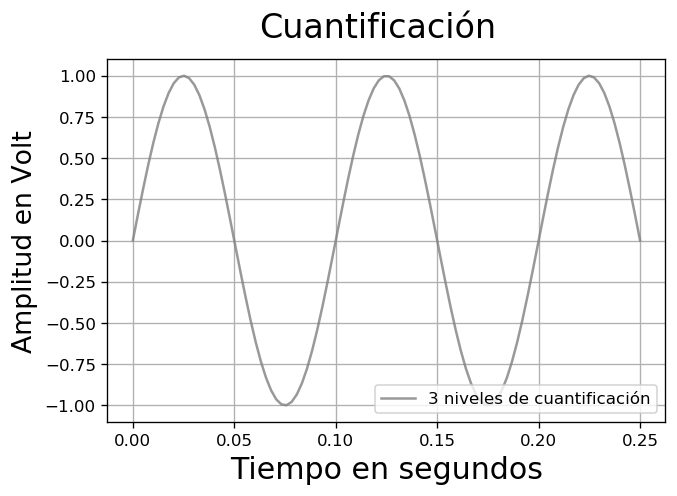

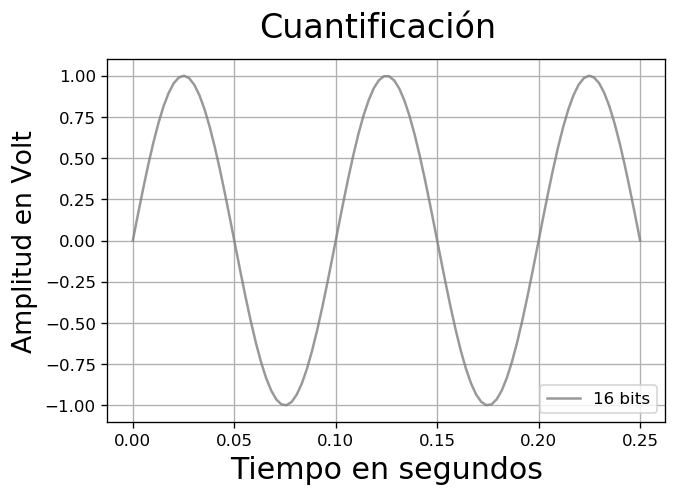

In [25]:
for leyenda in ['3 niveles de cuantificación', '16 bits']:

    t = np.linspace(0, 0.25, 100)
    x = np.sin(2 * np.pi * 10 * t)
    
    plt.figure(1, dpi=120)
    plt.plot(t, x, 'grey', alpha=0.8)
    plt.figure(1).suptitle('Cuantificación', fontsize=20)
    plt.legend([leyenda], loc=4)
    plt.xlabel('Tiempo en segundos', fontsize=18)
    plt.ylabel('Amplitud en Volt', fontsize=16)
    #plt.xticks([0, 0.3])
    #plt.yticks([0, 0.3, 0.5, 1, 1.2])
    #plt.xlim(0, 3)
    #plt.ylim([-1.5, 1.5])
    plt.grid(True)
    plt.show()

### Modulación digital

Luego de muestrear y cuantificar la señal, se lleva a cabo el proceso de **modulación**, bien conocido, en el que se **transforma la señal de información** *(de naturaleza digital)* en una forma apta para su transmisión, en este caso, digital.

Como se abordó en sistemas analógicos de modulación, se realiza un producto matemático entre la señal de información y una señal generada localmente. En este caso el resultado o *señal modulada* está conformada por un tren de pulsos.

Remitiendo al concepto de modulación, la información de la señal que se desea enviar resulta *"impresa" en alguna de las características de la señal modulada*, según dicha característica, la modulación por pulsos se clasifica como sigue:

* **PAM**

*Pulse Amplitude Modulation*, **Modulación por amplitud de pulsos**, como su nombre lo indica, la información sobre los niveles de tensión de la señal original se encuentran en la **amplitud** de los pulsos de la señal modulada.

* **PWM o PDM**

*Pulse With/Duration Modulation*, **Modulación por ancho/duración de pulsos**, como su nombre lo indica, la información sobre los niveles de tensión de la señal original se encuentran en el **ancho o duración** de los pulsos la señal modulada.

* **PPM**

*Pulse Position Modulation*, **Modulación por posición de pulsos**, como su nombre lo indica, la información sobre los niveles de tensión de la señal original se encuentran en el **posición** en el eje de tiempo de los pulsos la señal modulada.

* **PCM**

*Pulse Code Modulation*, **Modulación por código de pulsos**, como su nombre lo indica, la información sobre los niveles de tensión de la señal original se encuentran en el **código** de los pulsos la señal modulada, esto es en el valor decimal que representa cada código binario

#### PAM

Modulación por amplitud de pulsos, se exponen a continuación dos señales que responden a las expresiones $x(t) = t$ y $seno(2·\pi·t)$ correspondientemente, sus muestras y el resultado del proceso de modulación por amplitud de pulsos, donde se puede observar que **los niveles de tensión de la señal original se encuentran en la amplitud de la señal modulada**.

In [26]:
def modulation_pam(t, x_muestreada):
    pam = []
    M = int( len(t) / (2 * len(x_muestreada)) )

    for i in range (len(x_muestreada)):
        #print('i: ', i)
        for j in range(M - 1):
            #print('j', j)
            pam.append(x_muestreada[i])
        for j in range(M - 1):
            pam.append(0)

    resto = 500 - len(pam)
    for k in range(resto):
        pam.append(0)
    
    return pam

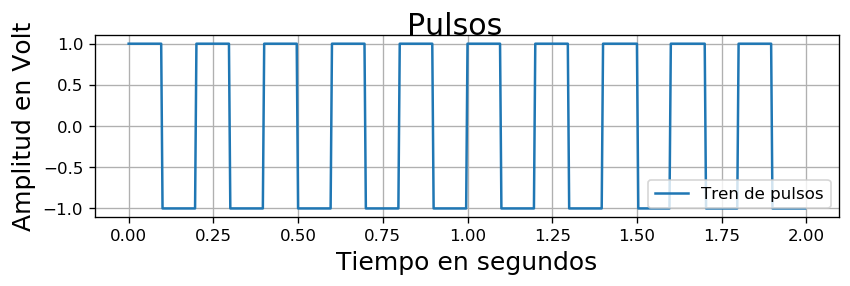

In [27]:
# Tren de pulsos
t = np.linspace(0, 2, 500, endpoint=False)
pulsos = signal.square(np.pi * 10 * t, duty=0.5)

plt.figure(1, dpi=120, figsize=[8, 2])
plt.plot(t, pulsos)
plt.figure(1).suptitle('Pulsos', fontsize=18)
plt.legend(['Tren de pulsos'], loc=4)
plt.xlabel('Tiempo en segundos', fontsize=15)
plt.ylabel('Amplitud en Volt', fontsize=15)
#plt.xticks([0, 0.3])
#plt.yticks([0, 0.3, 0.5, 1, 1.2])
#plt.xlim(0, 3)
#plt.ylim([-1.5, 1.5])
plt.grid(True)
plt.savefig('pulsos')
plt.show()



#ploteo(-1, [t, pulsos], , 'Tiempo [s]', 'Amplitud [V]')

In [28]:
def subplot(figura, lista_funciones, leyendas, x_label, y_label):
    """
    recibe una lista de listas de la forma:
    [[x, y, color_forma], [x2, y2, color_forma2]], [leyenda, leyenda1], x_label, y_label
    """

    n = len(lista_funciones)
    f, axarr = plt.subplots(n, sharex=True, sharey=True, figsize=(10, 10))
    f.text(0.04, 0.5, y_label, va='center', rotation='vertical')

    for i, funcion in enumerate(lista_funciones):
        axarr[i].plot(*funcion)

    f.subplots_adjust(hspace=0)
    plt.xlabel(x_label)

    # Hide x labels and tick labels for all but bottom plot.
    for i, ax in enumerate(axarr):
        ax.label_outer()
        ax.grid()
        ax.legend(leyendas[i], loc=4)

    #plt.savefig('img/' + str(leyendas[-1]) + '_' + str(datetime.datetime.now().second))  
    plt.xticks(lista_funciones[0][3])
    plt.show()

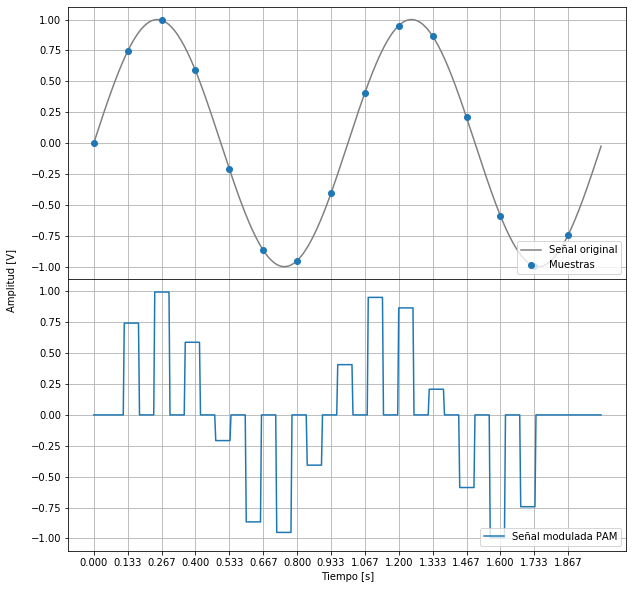

In [29]:
x = np.sin(2 * np.pi * t)

N = 5

muestreo = np.linspace(0, 2, N * 3, endpoint=False)
x_muestreada = signal.resample(x, N * 3)
x_muestreada[0] = 0

pam = modulation_pam(t, x_muestreada)

lista_funciones = [[t, x, 'grey', muestreo, x_muestreada, 'o'], [t, pam]]
leyendas = [['Señal original', 'Muestras'], ['Señal modulada PAM']]

subplot(1, lista_funciones, leyendas, 'Tiempo [s]', 'Amplitud [V]')

#### PWM / PDM

Modulación por ancho/duración de pulsos, se exponen a continuación dos señales que responden a las expresiones $x(t) = t$ y $seno(2·\pi·t)$ correspondientemente, sus muestras y el resultado del proceso de modulación por ancho/duración de pulsos, donde se puede observar que **los niveles de tensión de la señal original se encuentran en el ancho o duración de los pulsos que conforman la señal modulada**.

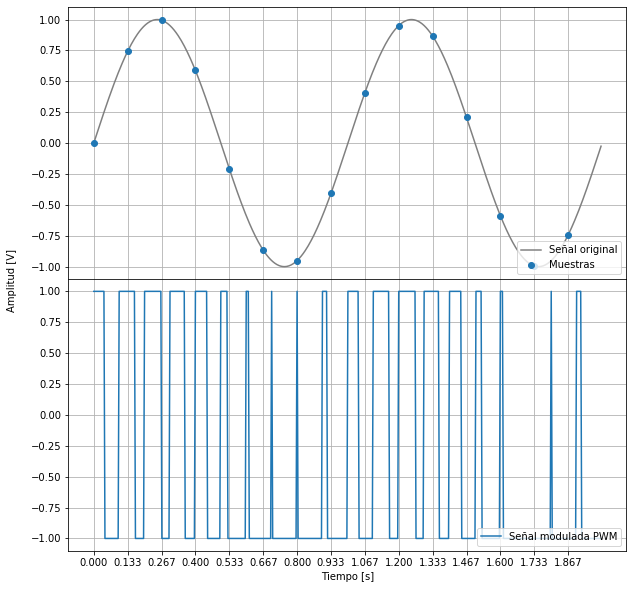

In [30]:
x = np.sin(2 * np.pi * t)

muestreo = np.linspace(0, 2, N * 3, endpoint=False)
x_muestreada = signal.resample(x, N * 3)
x_muestreada[0] = 0

pwm = signal.square(2 * np.pi * 10 * t, duty=(x + 1)/3)

lista_funciones = [[t, x, 'grey', muestreo, x_muestreada, 'o'], [t, pwm]]
leyendas = [['Señal original', 'Muestras'], ['Señal modulada PWM']]

subplot(1, lista_funciones, leyendas, 'Tiempo [s]', 'Amplitud [V]')

#### PPM

Modulación por posición de pulsos, se exponen a continuación dos señales que responden a las expresiones $x(t) = t$ y $seno(2·\pi·t)$ correspondientemente, sus muestras y el resultado del proceso de modulación por posición de pulsos, donde se puede observar que **los niveles de tensión de la señal original se encuentran en la posición de los pulsos que conforman la señal modulada**.

In [31]:
def crear_onda_cuadrada(medio_ciclo, cantidad_ciclos):
    onda_cuadrada = [1] * medio_ciclo + [0] * medio_ciclo
    onda_cuadrada = onda_cuadrada * cantidad_ciclos
    return onda_cuadrada

In [32]:
def modulation_ppm(medio_ciclo, cantidad_ciclos, x_muestreada):
    onda_cuadrada = crear_onda_cuadrada(medio_ciclo, cantidad_ciclos)
    
    copia_onda_cuadrada = onda_cuadrada.copy()
    ciclo = medio_ciclo * 2
    
    desplazamientos = preprocessing.minmax_scale(x_muestreada, 
                                                 feature_range=(0, medio_ciclo), axis=0, copy=True)
    desplazamientos = desplazamientos.astype(int)
    
    for i, desplazamiento in enumerate(desplazamientos):
        start_index = i * ciclo
        for j in range(ciclo - desplazamiento):
            copia_onda_cuadrada[start_index + j + desplazamiento] = onda_cuadrada[start_index + j]

        for j in range(desplazamiento):
            copia_onda_cuadrada[start_index + j] = 0
            
    resto = 500 - len(copia_onda_cuadrada)
    for i in range(resto):
        copia_onda_cuadrada.append(0)
             
    return copia_onda_cuadrada

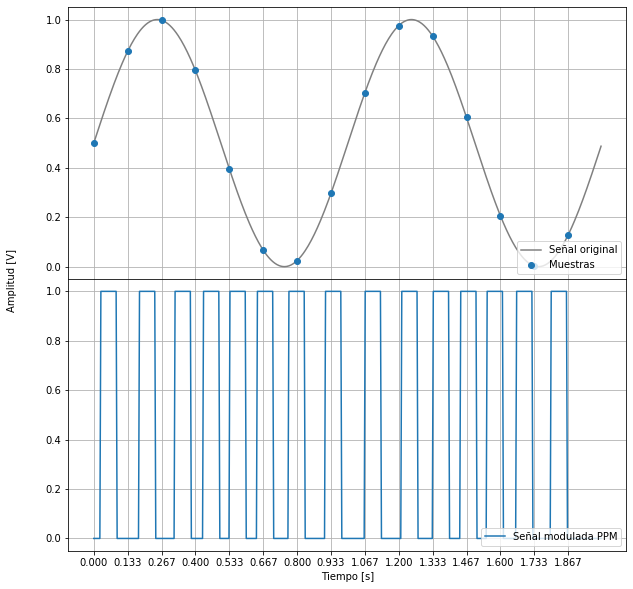

In [33]:
t = np.linspace(0, 2, 500, endpoint=False)
x = 0.5 + 0.5*np.sin(2 * np.pi * t)
muestreo = np.linspace(0, 2, N * 3, endpoint=False)
x_muestreada = signal.resample(x, N * 3)
x_muestreada[0] = 0.5

medio_ciclo = int( len(t) / (2 * len(x_muestreada)) )
cantidad_ciclos = len(x_muestreada)

ppm = modulation_ppm(medio_ciclo, cantidad_ciclos, x_muestreada)

lista_funciones = [[t, x, 'grey', muestreo, x_muestreada, 'o'], [t, ppm]]
leyendas = [['Señal original', 'Muestras'], ['Señal modulada PPM']]

subplot(1, lista_funciones, leyendas, 'Tiempo [s]', 'Amplitud [V]')

#### PCM

Modulación por códigos de pulsos, se exponen a continuación dos señales que responden a las expresiones $x(t) = t$ y $seno(2·\pi·t)$ correspondientemente, sus muestras y el resultado del proceso de modulación por código de pulsos, donde se puede observar que **los niveles de tensión de la señal original se encuentran en los códigos binarios que conforman la señal modulada**.

![](https://upload.wikimedia.org/wikipedia/commons/3/34/Conversion.JPG)
*["Conversion"](https://commons.wikimedia.org/wiki/File:Conversion.JPG) de Zerstreut / Public Domain.*

In [34]:
def modulation_pcm(x_muestreada):
    lista_binarios = []
    for muestra in x_muestreada:
        binario = np.binary_repr( int(muestra) )
        lista_binarios.append(binario)
    return(lista_binarios)

In [35]:
def ploteo_pcm(t, x, muestreo, x_muestreada):

    fig = plt.figure(1, dpi=120)
    ax = fig.add_subplot(111)

    plt.plot(t, x, 'grey', muestreo, x_muestreada, 'o')

    for i, valor in enumerate(pcm):
        ax.annotate(valor, xy=(muestreo[i], x_muestreada[i]), xytext=(muestreo[i], x_muestreada[i] - 1))
        ax.annotate(int(x_muestreada[i]), xy=(muestreo[i], x_muestreada[i]), xytext=(muestreo[i], x_muestreada[i] + 1))

    plt.grid()
    plt.legend(['Señal original', 'Muestras y su código PCM'], loc=4)
    plt.xlabel('Tiempo [s]')
    plt.ylabel('Amplitud [V]')

    #plt.savefig('img/' + 'Muestras y su código PCM' + '_' + str(datetime.datetime.now().second))
    plt.show()

/home/bibiana/usr/miniconda3/envs/webapp/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  after removing the cwd from sys.path.


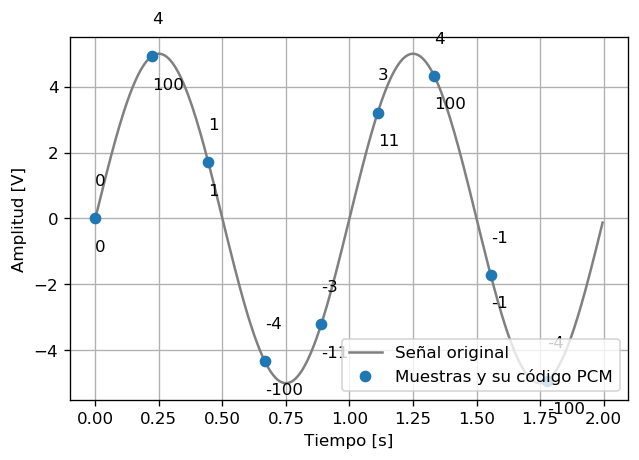

In [36]:
t = np.linspace(0, 2, 500, endpoint=False)
x = 5 * np.sin(2 * np.pi * t)

N = 3
muestreo = np.linspace(0, 2, N * 3, endpoint=False)
x_muestreada = signal.resample(x, N * 3)
x_muestreada[0] = 0

pcm = modulation_pcm(x_muestreada)

fig = plt.figure(1, dpi = 120)
ax = fig.add_subplot(111)

ploteo_pcm(t, x, muestreo, x_muestreada)

A continuación se muestra una señal variable y sus muestras en el tiempo y los resultados de los cuatro tipos de modulación abordados:

`Completar la información faltante`

*(Ejercicio de parcial)*

In [37]:
def ploteo_vacio(leyenda):
    plt.figure(1, dpi=120)
    plt.grid()
    plt.title(leyenda)
    plt.xlabel('Tiempo [s]')
    plt.ylabel('Amplitud [V]')
    plt.xlim(0, 10)
    plt.ylim(min(x), max(x))
    #plt.xticks(tiempos)
    plt.show()

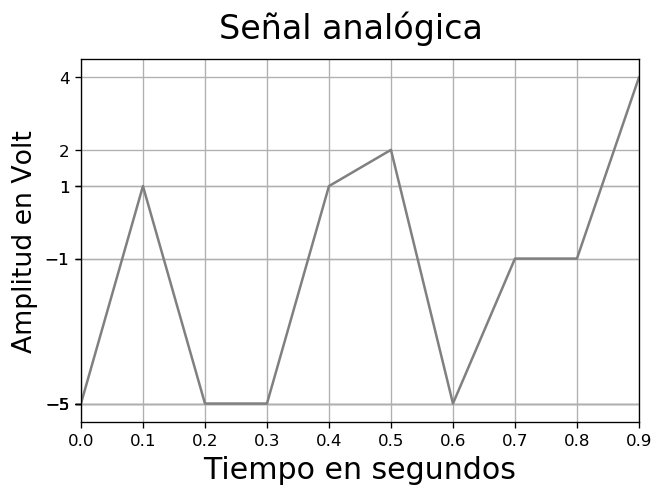

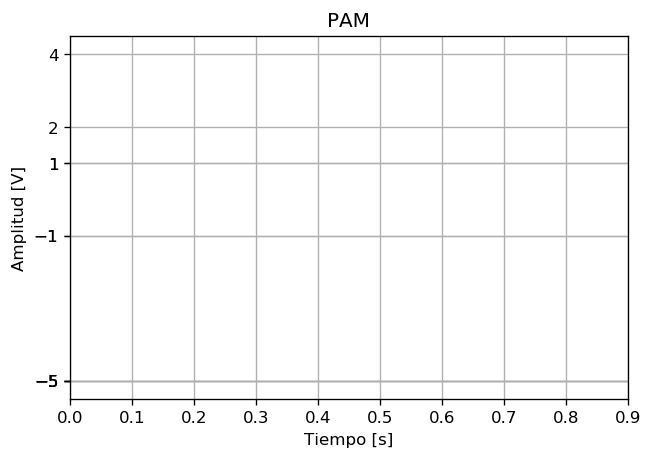

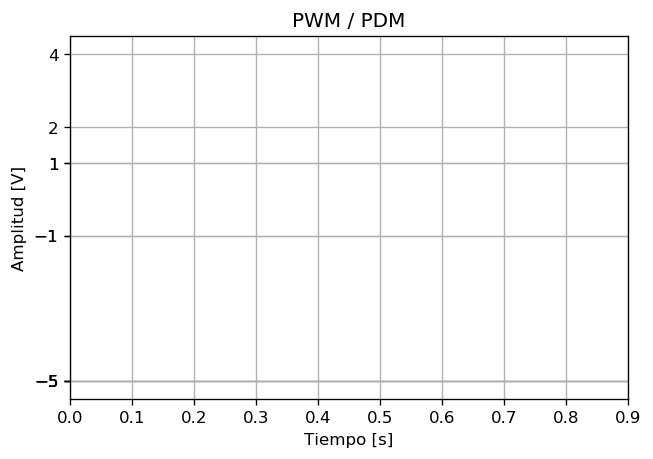

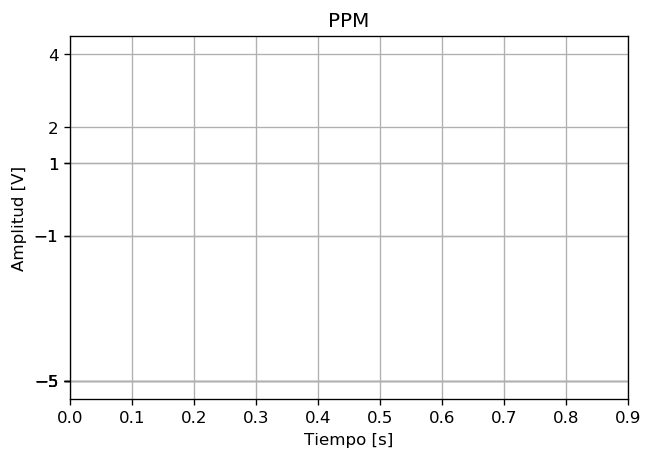

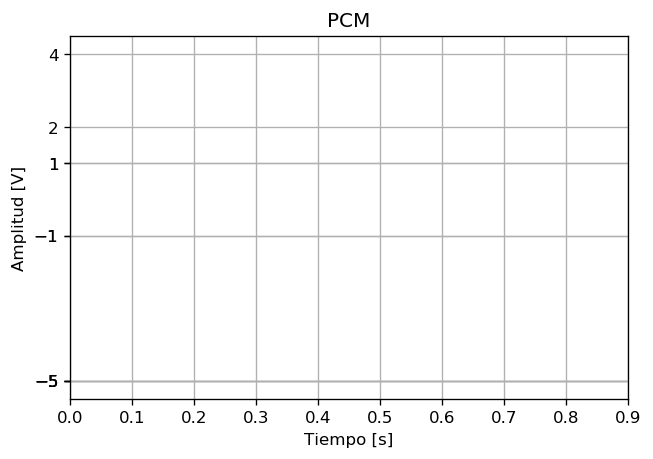

In [38]:
señal_aleatoria = np.random.randint(-5, 5, size = 10)
t = np.linspace(0, 1, 10, endpoint=False)

N = 4
muestreo = np.linspace(0, 1, N * 3, endpoint=False)
x_muestreada = signal.resample(señal_aleatoria, N * 3)
x_muestreada[0] = 0

lista_funciones = [t, señal_aleatoria]
leyendas = ['Señal analógica']

#ploteo(1, lista_funciones, leyendas, 'Tiempo [s]', 'Amplitud [V]')
plt.figure(1, dpi=120)
plt.plot(t, señal_aleatoria, 'grey')
plt.figure(1).suptitle('Señal analógica', fontsize=20)
#plt.legend(['Señal original', 'Cuantificación', 'Error'])
plt.xlabel('Tiempo en segundos', fontsize=18)
plt.ylabel('Amplitud en Volt', fontsize=16)
plt.xticks(t)
plt.yticks(señal_aleatoria)
plt.xlim(t[0], t[-1])
plt.ylim([min(señal_aleatoria)-0.5, max(señal_aleatoria)+0.5])
plt.grid(True)
plt.show()

modulaciones = ['PAM', 'PWM / PDM', 'PPM', 'PCM']
for mod in modulaciones:
    plt.figure(1, dpi=120)
    plt.title(mod)
    plt.xlabel('Tiempo [s]')
    plt.ylabel('Amplitud [V]')
    plt.xticks(t)
    plt.yticks(señal_aleatoria)
    plt.xlim(t[0], t[-1])
    plt.ylim([min(señal_aleatoria)-0.5, max(señal_aleatoria)+0.5])
    plt.grid()
    plt.show()

¡**AUTOTUNE**!